In [1]:
%run lgs03a_data_unification.ipynb

In [2]:
epistatic_pairs_pos = {gene : 
                     doublemuts[doublemuts.gene==gene+'GFP'].groupby('position_pseudo').apply(
                                                                             lambda x: list(x['epistasis']))
                     for gene in ['amac', 'amacV14L', 'cgre', 'pplu', 'av']}
epistatic_pairs_pos = {gene : dict(epistatic_pairs_pos[gene]) for gene in epistatic_pairs_pos}

In [23]:
%run lgs_figures_functions.ipynb

<Figure size 432x288 with 0 Axes>

In [3]:
import warnings
warnings.filterwarnings(action='ignore')

In [5]:
genes = ['amac','av','cgre','pplu']

## Fig. 2: Heterogeneity of fitness peaks

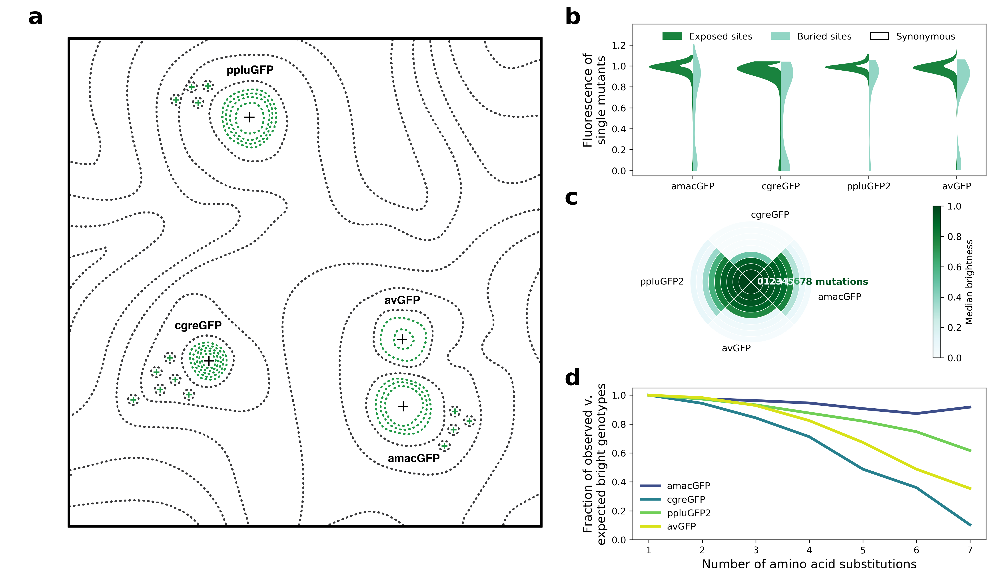

In [8]:
fig = plt.figure(figsize=[15,9], dpi=300)

ax = make_figure_letters(fig, {'a':(0,1), 'b':(0.56,1) , 'c':(0.56,0.65), 'd':(0.56,0.30)}, fontsize= 25)

ax1 = fig.add_subplot(3,5,(1,13))
show_image(os.path.join(figures_folder, 'other_images', 'katya_fig1_v2.png'))

ax2 = fig.add_subplot(3,5,(4,5))
plot_buried_vs_exposed_violins('BuGn')


ax3 = fig.add_subplot(3,5,(9,10))
cheesescapes(pad=0.3)

ax4 = fig.add_subplot(3,5,(14,15))
plot_predicted_bright_vs_real(data_aa_scaled, -0.4)

plt.tight_layout()

# plt.savefig(os.path.join(figures_folder,'figure1.png'), dpi=300)

**A**, Side by side comparison of the sharpness of different GFP fitness peaks, showing the median relative brightness of genotypes at different mutational steps away from the wild-type. **B**, Distribution of fluorescence of genotypes with a single amino acid substitution in exposed versus buried sites, compared to the wild-type distribution of genotypes with only synonymous nucleotide mutations. **C**, Fraction of genotypes observed to display above-zero fluorescence in our data, out of all those expected to be fluorescent if all mutation effects were additive.

## Effects across backgrounds

In [9]:
neutral_cutoff = -0.05
bad_cutoff = -0.15
epistasis_cutoff = 0.3

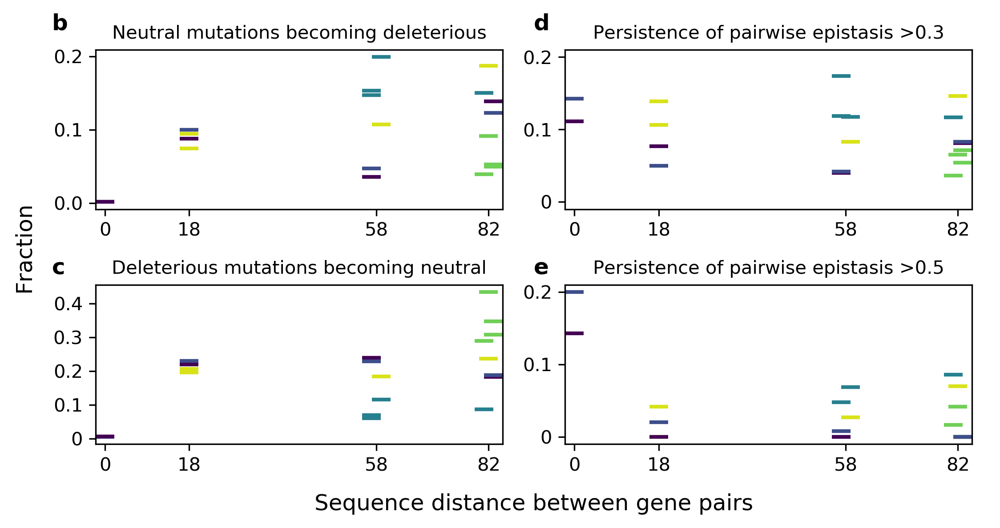

In [11]:
fig = plt.figure(figsize=[8,4.5], dpi=300)

ax = make_figure_letters(fig, {'b':(-0.05, 1.05), 'd':(0.5,1.05), 'c':(-0.05, 0.43), 'e':(0.5,0.43)}, fontsize=12)

# ax = fig.add_subplot(1,1,1)
# for side in ['top','bottom','right','left']:
#     ax.spines[side].set_color(None)
# ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)
# plt.text(-0.05,1.05,'a', fontsize=15, weight='bold')
# plt.text(0.5,1.05,'b', fontsize=15, weight='bold')
# plt.text(-0.05,0.43,'c', fontsize=15, weight='bold')
# plt.text(0.5,0.43,'d', fontsize=15, weight='bold')
plt.ylabel('Fraction', labelpad=10, fontsize=12)
plt.xlabel('Sequence distance between gene pairs', labelpad=10, fontsize=12)

ax1 = fig.add_subplot(2,2,1)
plot_fraction_changed_effect(df_effects_singles, neutral_cutoff, bad_cutoff, 
                             mode='n2b', style='simple',sf=100, marker='_', linewidth=2, 
                             label='Neutral to deleterious')
plt.title('Neutral mutations becoming deleterious', fontsize=10)

ax2 = fig.add_subplot(2,2,3)
plot_fraction_changed_effect(df_effects_singles, neutral_cutoff, bad_cutoff, 
                             mode='b2n', style='simple',sf=100, marker='_', linewidth=2)
plt.yticks([0,0.1,0.2,0.3,0.4], [0,0.1,0.2,0.3,0.4])
plt.title('Deleterious mutations becoming neutral', fontsize=10)

ax3 = fig.add_subplot(2,2,2)
plot_shared_epistatic_pairs(epistasis_cutoff,style='simple',sf=100, marker='_', linewidth=2)
plt.yticks([0,0.1,0.2,], [0,0.1,0.2,])
plt.ylim(-0.01,0.21)
plt.title('Persistence of pairwise epistasis >0.3' ,fontsize=10)

ax4 = fig.add_subplot(2,2,4)
plot_shared_epistatic_pairs(0.5,style='simple',sf=100, marker='_', linewidth=2)
plt.yticks([0,0.1,0.2,], [0,0.1,0.2,])
plt.ylim(-0.01,0.21)
plt.title('Persistence of pairwise epistasis >0.5' ,fontsize=10)

plt.tight_layout()

# plt.savefig(os.path.join(figures_folder, 'figure2.png'), dpi=300)

## Figure 4: Results of neural net predictions

In [12]:
predictions = load_predictions_data()

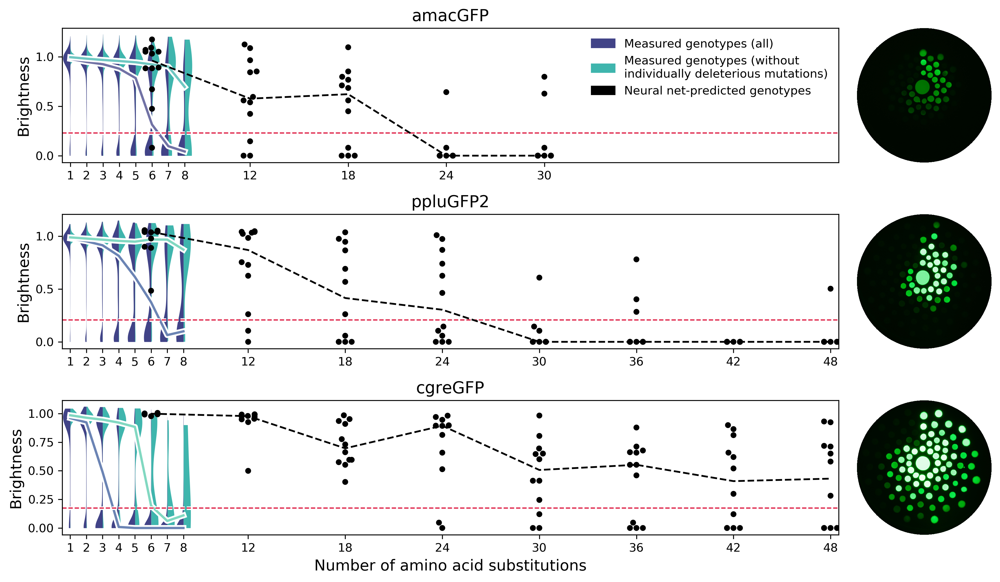

In [16]:
fig = plt.figure(figsize=[12,7], dpi=300)

# make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.65), 'c':(-0.05, 0.30)}, fontsize=20)

ax1 = fig.add_subplot(3,6,(1,5))
mako = ListedColormap(sns.color_palette('mako', 256))
plot_predictions('amac',mode='full',color=[[mako(180), mako(180)], [mako(80), mako(80)]])
legendary(colors=[mako(80), mako(180), 'k'], loc='upper right', fontsize=10,
                  labels=['Measured genotypes (all)', 
                          'Measured genotypes (without\nindividually deleterious mutations)', 
                          'Neural net-predicted genotypes'], ncol=1, )
label_plot_axis(y='Brightness', t='amacGFP', fontsize_t=14)
plt.xticks(list(range(8))+[11,17,23,29], list(range(1,9))+[12,18,24,30])

ax6 = fig.add_subplot(3,6,6)
show_image(os.path.join(figures_folder, 'other_images', 'prediction_blobs_amac.png'))

ax2 = fig.add_subplot(3,6,(7,11))
plot_predictions('pplu',mode='full',color=[[mako(180), mako(200)], [mako(80), mako(100)]])
label_plot_axis( y='Brightness', t='ppluGFP2', fontsize_t=14)

ax3 = fig.add_subplot(3,6,12)
show_image(os.path.join(figures_folder, 'other_images','prediction_blobs_pplu.png'))

ax4 = fig.add_subplot(3,6,(13,17))
plot_predictions('cgre',mode='full',color=[[mako(180), mako(200)], [mako(80), mako(100)]])
label_plot_axis(x='Number of amino acid substitutions', y='Brightness', t='cgreGFP', fontsize_t=14)

ax5 = fig.add_subplot(3,6,18)
show_image(os.path.join(figures_folder,'other_images', 'prediction_blobs_cgre.png'))

plt.tight_layout()

# plt.savefig(os.path.join(figures_folder, 'figure3.png'), dpi=300)

## Suppl. Fig. 2: Library sorting

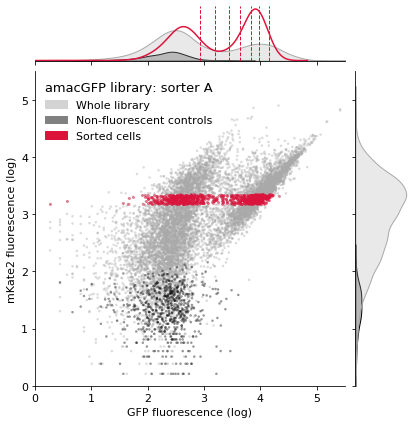

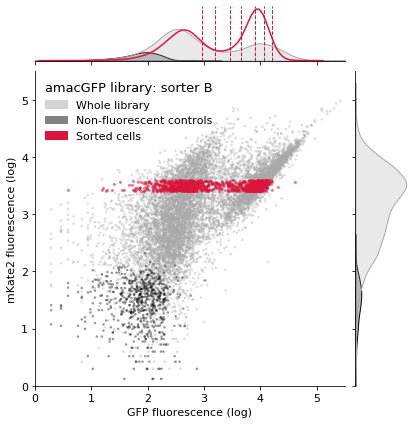

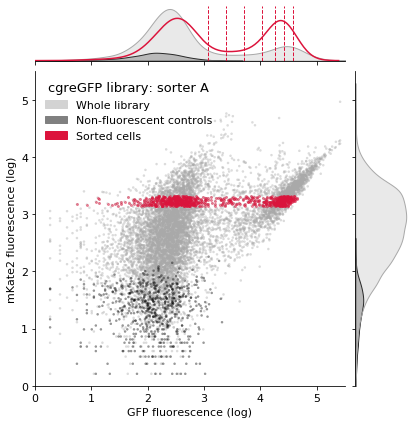

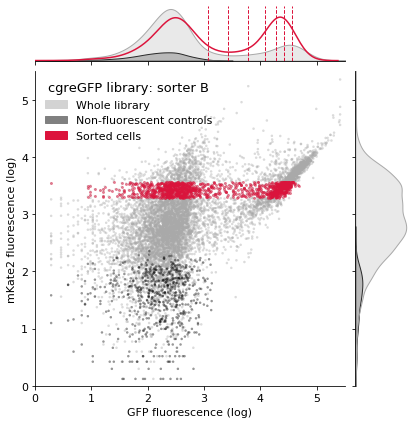

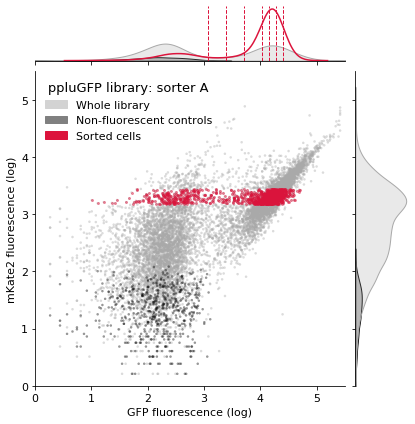

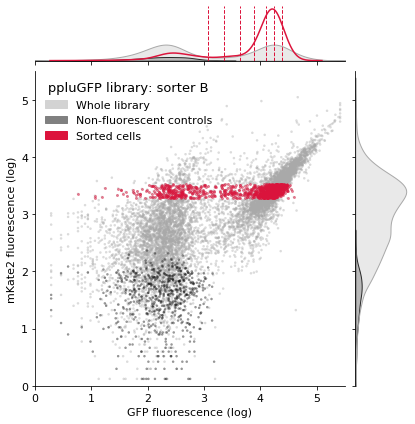

In [29]:
for gene in ['amac', 'cgre', 'pplu']:
    for machine in ['A', 'B']:
        sortingplot_library_scatter(gene, machine)
#         plt.savefig(os.path.join(figures_folder, gene+machine+'_sortingscatter.png'), format='png', dpi=500)

## Suppl. Fig. 9: Extant vs non-extant mutations

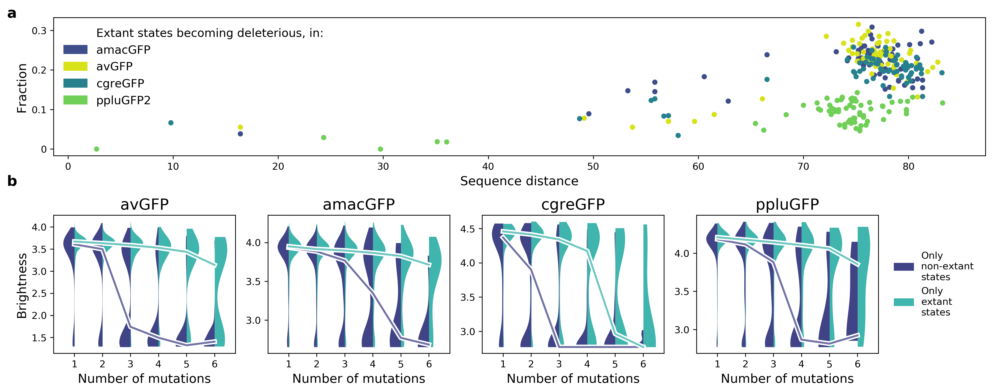

In [93]:
fig = plt.figure(figsize=[15,6], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)

j=9

ax1 = fig.add_subplot(2,j,(1,j))
for gene in ['amac','av','cgre','pplu']:
    compare_against_extant(gene, nok=bad_cutoff, overlap_n=1, s=20, marker='o')
legendary(['w']+[colors[gene] for gene in ['amac','av','cgre','pplu']], 
          ['Extant states becoming deleterious, in:','amacGFP','avGFP','cgreGFP','ppluGFP2'],
         fontsize=12, )
plt.yticks([0,0.1,0.2,0.3],[0,0.1,0.2,0.3])
label_plot_axis(x='Sequence distance', y='Fraction')

i = j+1
for gene in ['av','amac','cgre','pplu']:
    ax = fig.add_subplot(2,j,(i,i+1))
    plot_extant_vs_nonextant_muts(gene, n=7)
    if  i==j+1:
        plt.ylabel('Brightness')
    i += 2
ax = fig.add_subplot(2,j,j*2)
legendary([mako(80), mako(180)], ['Only\nnon-extant \nstates', 'Only\nextant\nstates'], loc='center right')
plt.axis('off')
    
plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'suppl_fig9.png'), dpi=300)

## Suppl. Fig. 3: Mutation effects by position

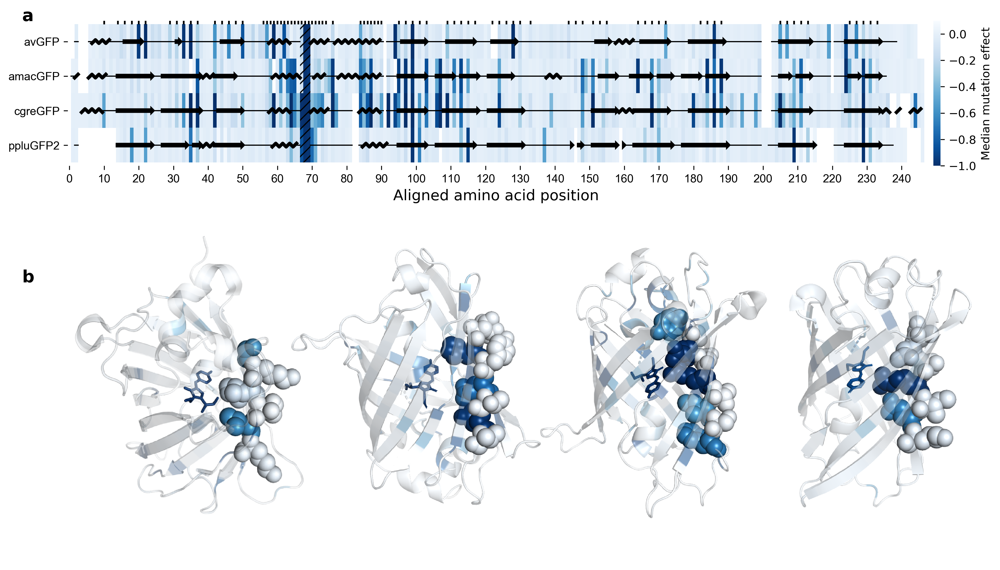

In [34]:
fig = plt.figure(figsize=[13,7], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.5)}, fontsize=15)


ax1 = fig.add_subplot(3,1,1)
plot_positional_effects_heatmap(df=df_effects_singles_scaled)
plt.title('')

ax2 = fig.add_subplot(3,1,(2,3))
show_image(os.path.join(figures_folder, 'other_images', 'allGFPs_scaled_effectsByPos.png'))
    
plt.tight_layout()

# plt.savefig(os.path.join(figures_folder, 'suppl_fig3.png'), dpi=300)

**A**, Median effects of single mutations according to sequence position. Positions constituting the chromophore are hatched, and internally-oriented sites are labeled with tick marks. Protein secondary structure, as extracted from the respective crystal structures, is overlaid. **B,C,D,E**, Median effects of single mutations visualized on protein 3D structures, respectively avGFP (2WUR), amacGFP, cgreGFP (2HPW), and ppluGFP2 (2G3O).

## Suppl. Fig. 4: Pairwise epistasis, general

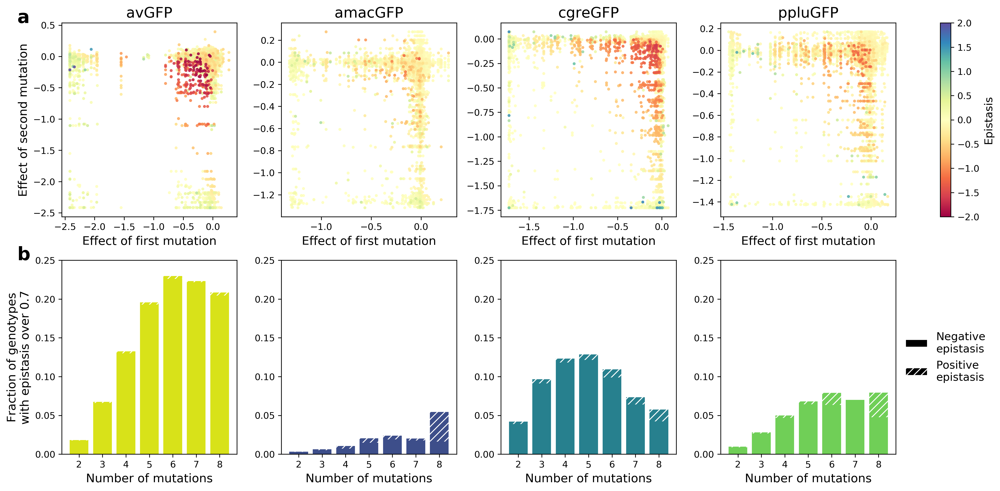

In [36]:
fig = plt.figure(figsize=[16,8], dpi=300)

make_figure_letters(fig, {'a':(-0.05,1), 'b':(-0.05,0.45)}, fontsize=20)


j = 17
for i,gene in zip(range(1,j*2,4), ['av', 'amac', 'cgre', 'pplu']):
    ax1 = fig.add_subplot(2,j,(i, i+3))
    doublemut_scatterplot(gene)
    if i>1:
        plt.ylabel('')
    ax2 = fig.add_subplot(2,j,(i+j,i+j+3))
    barplot_epistasis(gene, e=0.7)
    plt.title('')
    if i>1:
        plt.ylabel('')
        

ax3 = fig.add_subplot(2,j,j)
norm = matplotlib.colors.Normalize(vmin=-2, vmax=2)
cb1 = matplotlib.colorbar.ColorbarBase(ax3, cmap=matplotlib.cm.Spectral,norm=norm,orientation='vertical')
cb1.ax.tick_params(labelsize=10)
cb1.set_label('Epistasis',color='k',size=12)
        
ax4 = fig.add_subplot(2,j,j*2)
plt.legend([mpatches.Patch(facecolor='k', edgecolor='w'),
    mpatches.Patch(facecolor='k', hatch='///', edgecolor='w')], ['Negative\nepistasis', 'Positive\nepistasis'],
          frameon=False, loc='center', fontsize=12)
plt.axis('off')

plt.tight_layout()     

# plt.savefig(os.path.join(figures_folder, 'suppl_fig4.png'), dpi=300)

**A**, Epistasis in genotypes with two mutations, highlighting negative epistatic interactions between individually neutral or slightly deleterious mutations. **B**, Fraction of genotypes with increasing numbers of mutations which display strong epistasis.

## Suppl. Fig. 6: Distances between amino acid pairs

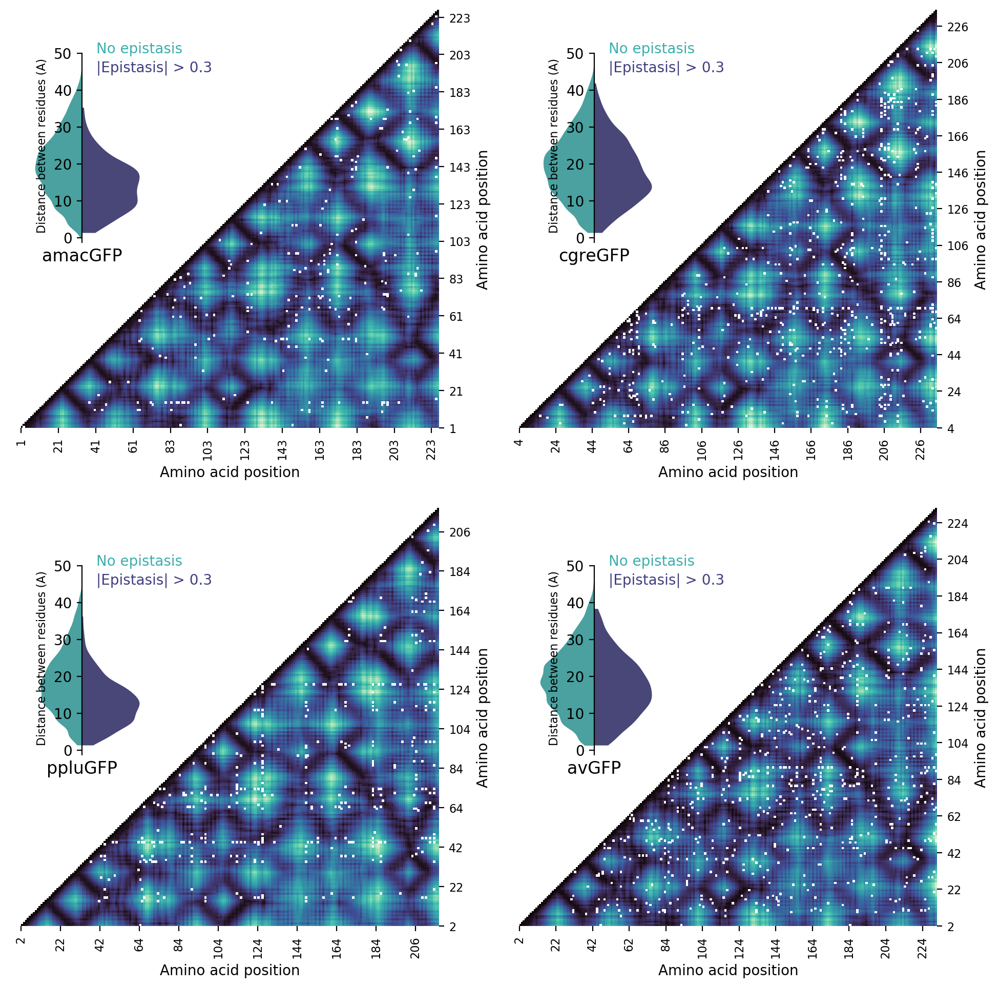

In [89]:
plot_all_distance_maps()
# plt.savefig(os.path.join(figures_folder, 'suppl_fig7.png'), dpi=300)

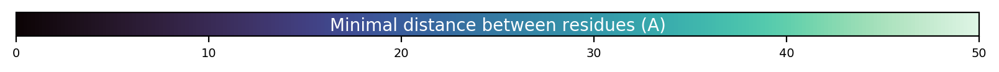

In [91]:
mako = ListedColormap(sns.color_palette('mako', 256))
fig,ax = plt.subplots(figsize=[10,0.5], dpi=200)
fig.subplots_adjust(bottom=0.5)

norm = matplotlib.colors.Normalize(vmin=0, vmax=50)
cb1 = matplotlib.colorbar.ColorbarBase(ax, cmap=mako,norm=norm,orientation='horizontal')
cb1.ax.tick_params(labelsize=7)
cb1.set_label('Minimal distance between residues (A)',labelpad=-25, color='w',)
plt.savefig(os.path.join(figures_folder, 'suppl_fig7_colorbar.png'),dpi=300)

Relationship of physical distance between two residues and their observed epistasis. Heatmaps show, for each gene, the minimal distance in Angstroms between two positions, with pairs of sites showing epistatic interactions over 0.3 shown in white. Inset violin plots show the distribution of distances between non-epistatic and epistatic pairs; in all cases, epistatic pairs tend to be physically closer (Mann Whitney U, p < 10^-13)

## Suppl. Fig. 5: Protein stability

In [8]:
spectra_abs, spectra_fluo = import_plate_reader_data()

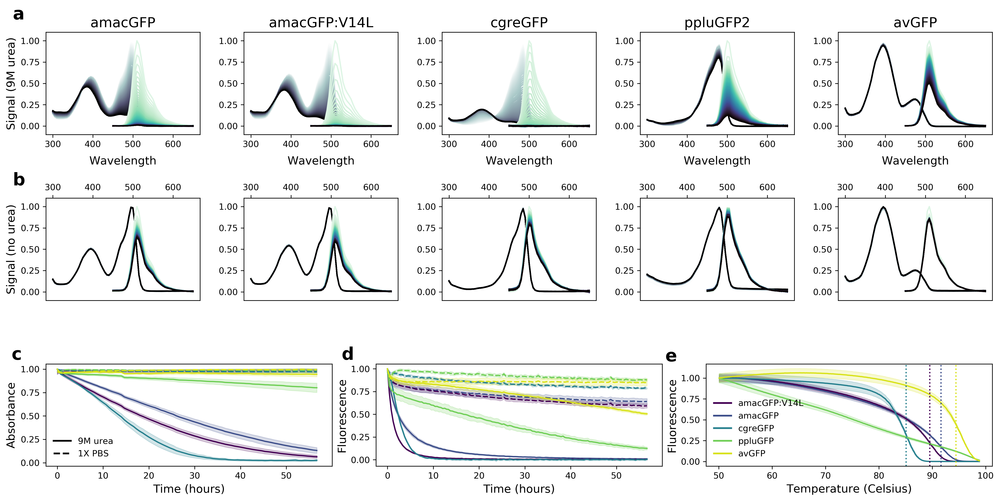

In [54]:
plt.figure(figsize=[16, 8], dpi=300)

i=1
for gene,title in zip(['amac', 'amacV14L', 'cgre', 'pplu', 'av'],
                  ['amacGFP', 'amacGFP:V14L', 'cgreGFP', 'ppluGFP2', 'avGFP']):
    plt.subplot(3,15,(i,i+2))
    plot_spectra(gene=gene, treatment='urea')
    label_plot_axis(t=title,)
    plt.xlabel('Wavelength', labelpad=8)
    if i==1:
        plt.ylabel('Signal (9M urea)')
        plt.text(200, 1.25, 'a', fontsize=20, weight='semibold')
        
    ax2 = plt.subplot(3,15,(i+15, i+15+2))
    plot_spectra(gene=gene, treatment='pbs')
    ax2.xaxis.tick_top()
    if i==1:
        plt.ylabel('Signal (no urea)')    
        plt.text(200, 1.25, 'b', fontsize=20, weight='semibold')
    i+=3
    
plt.subplot(3,15,(31,35))
plot_peak_timelapse('Absorbance')
plt.text(-10, 1.1, 'c', fontsize=20, weight='semibold')

plt.subplot(3,15,(36,40))
plot_peak_timelapse('Fluorescence')
plt.text(-10, 1.1, 'd', fontsize=20, weight='semibold')

plt.subplot(3,15,(41,45))
plot_thermosensitivity()
plt.text(40, 1.2, 'e', fontsize=20, weight='semibold')
    
    
plt.tight_layout(pad = 0.5)

# plt.savefig(os.path.join(figures_folder, 'suppl_fig5.png'), dpi=300)

**A,B**, Absorbance (grey) and fluorescence (green) spectra of purified protein in 9M urea (A) or 1X PBS (B), at room temperature, measured every 30 minutes for 60 hours; darker lines correspond to later timepoints. Plotted values are the means of eight technical replicates. **C**, Maximum absorbance across time in 9M urea and 1X PBS. **D**, Maximum fluorescence across time in 9M urea and 1X PBS. **E**, Fluorescence of purified protein at increasing temperatures; melting temperatures indicated by dashed vertical lines, where possible. Gene color codes are shared between **C,D,E**, and shaded areas indicate standard deviation of eight technical replicas.

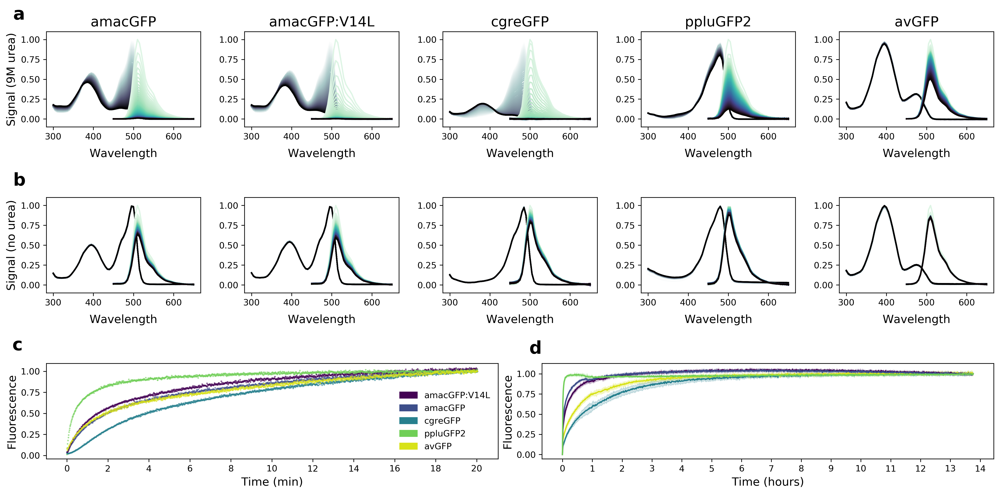

In [25]:
plt.figure(figsize=[16, 8], dpi=300)

for i,gene in zip(range(1,10,2),['amac', 'amacV14L', 'cgre', 'pplu', 'av']):
    plt.subplot(3,10,(i,i+1))
    plot_spectra(gene=gene, treatment='urea')
    label_plot_axis(t=names[gene],)
    plt.xlabel('Wavelength', labelpad=8)
    if i==1:
        plt.ylabel('Signal (9M urea)')
        plt.text(200, 1.25, 'a', fontsize=20, weight='semibold')
        
    ax2 = plt.subplot(3,10,(i+10, i+10+1))
    plot_spectra(gene=gene, treatment='pbs')
    plt.xlabel('Wavelength', labelpad=8)
#     ax2.xaxis.tick_top()
    if i==1:
        plt.ylabel('Signal (no urea)')    
        plt.text(200, 1.25, 'b', fontsize=20, weight='semibold')
    
plt.subplot(3,10,(21,25))
plot_refolding('short')
legendary([colors[gene] for gene in ['amacV14L','amac','cgre','pplu','av']],
          ['amacGFP:V14L','amacGFP','cgreGFP','ppluGFP2','avGFP'])
plt.text(-160, 1.25, 'c', fontsize=20, weight='semibold')

plt.subplot(3,10,(26,30))
plot_refolding('long')
plt.text(-4000, 1.25, 'd', fontsize=20, weight='semibold')
    
    
plt.tight_layout()

plt.savefig(os.path.join(figures_folder, 'new_suppl_fig_urea.png'), dpi=300)

## Suppl. Fig. X: Effect of mutations in amacGFP and amacGFP:V14L

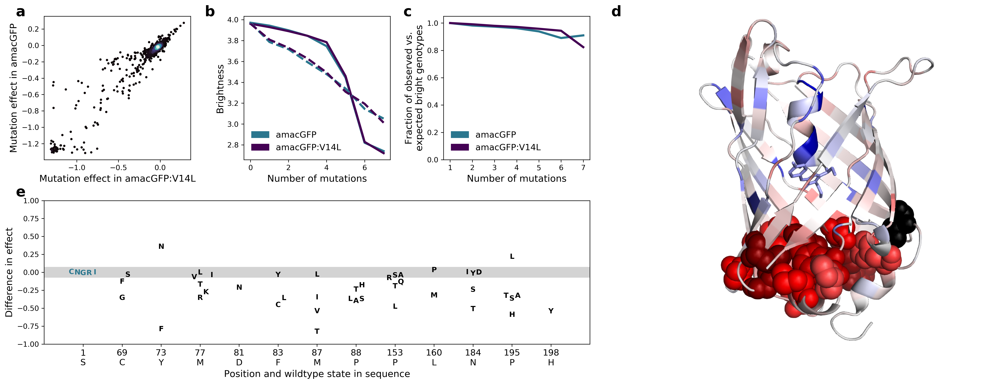

In [78]:
fig = plt.figure(figsize=[20,8], dpi=300)

make_figure_letters(fig, {'a':(-0.03,1), 'b':(0.17,1), 'c':(0.38,1), 'd':(0.6,1), 'e':(-0.03,0.45)}, 
                    fontsize=20)

# correlation between mutation effects
ax = fig.add_subplot(2,5,1)
density_plot(np.array(df_effects_singles['effect_in_amacV14L']), np.array(df_effects_singles['effect_in_amac']),
            s=10, cmap='mako')
label_plot_axis(x='Mutation effect in amacGFP:V14L', y='Mutation effect in amacGFP')

# mean and median brightnes vs number of mutations
ax = fig.add_subplot(2,5,2)
plt.plot(range(8), [data_aa[amacV14V_mask & (data_aa.n_mut==i)]['brightness'].median() for i in range(8)],
        color=c(100), linewidth=3)
plt.plot(range(8), [data_aa[amacV14L_mask & (data_aa.n_mut==i)]['brightness'].median() for i in range(8)],
        color=c(0), linewidth=3)
plt.plot(range(8), [data_aa[amacV14V_mask & (data_aa.n_mut==i)]['brightness'].mean() for i in range(8)],
        color=c(100), linewidth=3, linestyle='--')
plt.plot(range(8), [data_aa[amacV14L_mask & (data_aa.n_mut==i)]['brightness'].mean() for i in range(8)],
        color=c(0), linewidth=3, linestyle='--')
label_plot_axis(y='Brightness',x='Number of mutations')
legendary([c(100), c(0)], ['amacGFP', 'amacGFP:V14L'], loc='lower left', fontsize=12)

# observed vs expected bright genotypes
ax = fig.add_subplot(2,5,3)
cutoff = gate_borders_log['amac'][1] - ref_wt_log['amacGFP']
plt.plot([get_ratio_predicted2observed_fluo(data_aa[amac_mask], n_mut=i, 
                            threshold=cutoff) for i in range(1,8)],
                 color=c(100),label='amacGFP', linewidth=3)
plt.plot([get_ratio_predicted2observed_fluo(data_aa[amacV14L_mask], n_mut=i, 
                            threshold=cutoff) for i in range(1,8)],
                 color=c(0),label='amacGFP:V14L', linewidth=3)
legendary([c(100), c(0)], ['amacGFP', 'amacGFP:V14L'], fontsize=12)
label_plot_axis(x='Number of mutations', 
               y='Fraction of observed vs.\nexpected bright genotypes')
plt.ylim(0.,1.05)
plt.xticks(range(7),range(1,8))

# example of differences in mutation effect
ax = fig.add_subplot(2,5,(6,8))
positions = [1, 69, 73, 77, 81, 83, 87, 88, 153, 160, 184, 195, 198]
plt.fill_between([-1,17], [-0.07,-0.07], [0.07,0.07], color='lightgrey')
df_effects_singles['native_position_amac'] = df_effects_singles['position'].apply(lambda x:
                                                    pseudopos_to_nativepos[x][1])
df_effects_singles['effect_amacV14L_minus_amac'] = df_effects_singles['effect_in_amacV14L'] - df_effects_singles['effect_in_amac']
for j in range(len(positions)):
    yvals, labels = get_mutposeffect(df_effects_singles, y_column='effect_amacV14L_minus_amac', 
                                 x_column = 'native_position_amac', x_val=positions[j])
    xvals, yvals, labels = set_x_coordinates(yvals, labels, y_distance_threshold=0.15, 
                                         center_x=j, x_distance=0.15)
    for i in range(len(yvals)):
        plt.text(x = xvals[i] , y = yvals[i], s=labels[i], size='medium', color=c(100) if j==0 else 'k',
               verticalalignment='center', horizontalalignment='center', weight='semibold')
plt.xlim(-1,len(positions))
plt.ylim(-1,1)
plt.xticks(range(len(positions)), [str(pos)+'\n'+amac_wt[pos] for pos in positions], fontsize=12)
label_plot_axis(x='Position and wildtype state in sequence', y='Difference in effect')

# pymol picture
ax = fig.add_subplot(2,5,(4,10))
show_image(os.path.join(figures_folder, 'other_images', 'amac_amacV14L_difference.png'))

plt.tight_layout(pad=2)

plt.savefig(os.path.join(figures_folder, 'suppl_fig6.png'), dpi=300)

**A**, Correlation between effects of specific mutations in amacGFP backgrounds with and without the V14L mutation (Pearson's r = 0.96). **B**, Median (solid lines) and mean (dashed lines) fluorescence values of amacGFP:V14V and amacGFP:V14L genotypes with increasing numbers of mutations. **C**, Fraction of amacGFP:V14V and amacGFP:V14L genotypes observed to be fluorescent versus those expected to be fluorescent under the assumption of no epistasis. **D**, Median difference in effect of mutations in amacGFP:V14L, in reference to amacGFP, colored on the crystal structure of amacGFP. Position 14 is colored in black; red signifies that mutations at those positions tend to have worse effects in amacGFP:V14L than in amacGFP, while blue signifies the opposite. Atoms of positions with a median difference worse than -0.1 are represented by spheres. **D**, Differences in mutation effect between amacGFP:V14L and amacGFP, at the twelve most affected positions. For reference, the majority of mutations throughout the sequence have a difference in effect between -0.07 and 0.07 (shaded region, see position 1S).